# DAB-300-Machine Learning
# Final Project- Loan Risk Prediction suing various Machine Learning Algorithms

Date of submission: 2020-12-16

Group-3 & members:
- Name (ID): Abhinav Sharma (0753639)-sec:006
- Name (ID): Nishant Mahajan (0753638)-sec:001
- Name (ID): Prashanth Nuthula (0753653)-sec:005
- Name (ID): Sai Sahas Elluru (0753808)-sec:003
- Name (ID): Siddharth Singh (0756590)-sec:005

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer

In [2]:
#import os
#os.chdir('E:\\Clair\\SEM3\\ML\\Project')

In [3]:
loan = pd.read_csv('credit_train.csv')

## Data Description

In [4]:
loan.columns

Index(['Loan ID', 'Customer ID', 'Loan Status', 'Current Loan Amount', 'Term',
       'Credit Score', 'Annual Income', 'Years in current job',
       'Home Ownership', 'Purpose', 'Monthly Debt', 'Years of Credit History',
       'Months since last delinquent', 'Number of Open Accounts',
       'Number of Credit Problems', 'Current Credit Balance',
       'Maximum Open Credit', 'Bankruptcies', 'Tax Liens'],
      dtype='object')

In [5]:
loan.shape

(100514, 19)

In [6]:
loan.drop(['Loan ID', 'Customer ID'], inplace=True, axis=1)

- We are dropping Loan ID and CUstomer ID, because it does not have any importance. They are just unique values to specify the loan and customer.

In [7]:
loan.head()

,Loan Status,Current Loan Amount,Term,Credit Score,Annual Income,Years in current job,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
0,Fully Paid,445412.0,Short Term,709.0,1167493.0,8 years,Home Mortgage,Home Improvements,5214.74,17.2,NaN,6.0,1.0,228190.0,416746.0,1.0,0.0
1,Fully Paid,262328.0,Short Term,NaN,NaN,10+ years,Home Mortgage,Debt Consolidation,33295.98,21.1,8.0,35.0,0.0,229976.0,850784.0,0.0,0.0
2,Fully Paid,99999999.0,Short Term,741.0,2231892.0,8 years,Own Home,Debt Consolidation,29200.53,14.9,29.0,18.0,1.0,297996.0,750090.0,0.0,0.0
3,Fully Paid,347666.0,Long Term,721.0,806949.0,3 years,Own Home,Debt Consolidation,8741.90,12.0,NaN,9.0,0.0,256329.0,386958.0,0.0,0.0
4,Fully Paid,176220.0,Short Term,NaN,NaN,5 years,Rent,Debt Consolidation,20639.70,6.1,NaN,15.0,0.0,253460.0,427174.0,0.0,0.0


In [8]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100514 entries, 0 to 100513
Data columns (total 17 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Loan Status                   100000 non-null  object 
 1   Current Loan Amount           100000 non-null  float64
 2   Term                          100000 non-null  object 
 3   Credit Score                  80846 non-null   float64
 4   Annual Income                 80846 non-null   float64
 5   Years in current job          95778 non-null   object 
 6   Home Ownership                100000 non-null  object 
 7   Purpose                       100000 non-null  object 
 8   Monthly Debt                  100000 non-null  float64
 9   Years of Credit History       100000 non-null  float64
 10  Months since last delinquent  46859 non-null   float64
 11  Number of Open Accounts       100000 non-null  float64
 12  Number of Credit Problems     100000 non-nul

- We can see there are so many null values. We will handle them acordingly.

In [9]:
loan.describe()

,Current Loan Amount,Credit Score,Annual Income,Monthly Debt,Years of Credit History,Months since last delinquent,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens
count,1.000000e+05,80846.000000,8.084600e+04,100000.000000,100000.000000,46859.000000,100000.00000,100000.000000,1.000000e+05,9.999800e+04,99796.000000,99990.000000
mean,1.176045e+07,1076.456089,1.378277e+06,18472.412336,18.199141,34.901321,11.12853,0.168310,2.946374e+05,7.607984e+05,0.117740,0.029313
std,3.178394e+07,1475.403791,1.081360e+06,12174.992609,7.015324,21.997829,5.00987,0.482705,3.761709e+05,8.384503e+06,0.351424,0.258182
min,1.080200e+04,585.000000,7.662700e+04,0.000000,3.600000,0.000000,0.00000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,1.796520e+05,705.000000,8.488440e+05,10214.162500,13.500000,16.000000,8.00000,0.000000,1.126700e+05,2.734380e+05,0.000000,0.000000
50%,3.122460e+05,724.000000,1.174162e+06,16220.300000,16.900000,32.000000,10.00000,0.000000,2.098170e+05,4.678740e+05,0.000000,0.000000
75%,5.249420e+05,741.000000,1.650663e+06,24012.057500,21.700000,51.000000,14.00000,0.000000,3.679588e+05,7.829580e+05,0.000000,0.000000
max,1.000000e+08,7510.000000,1.655574e+08,435843.280000,70.500000,176.000000,76.00000,15.000000,3.287897e+07,1.539738e+09,7.000000,15.000000


In [10]:
loan = loan[(loan['Credit Score'] <= 850)]

- The maximum value in the credit score is 7510, which is insignificant. The maximum credit score is 850, so using above code we have removed those outliers.

In [11]:
loan = loan[(loan['Maximum Open Credit'] > 0)]

- The minimum value in the maximum open credit is 0 which is again an insignificant value. Maximum open credit is the credit balance that a loanee get if he has a credit card. So, using the above code we have removed those values.

In [12]:
loan = loan[(loan['Monthly Debt'] > 0)]

- If the person has taken loan, then definately he/she has the monthly debt. But there are values with monthly debt as 0. So we removed those values using the above code.

## Checking for Outliers

In [13]:
num = [x for x in loan.columns if loan[x].dtypes!='O']
for k, v in loan[num].items():
        q1 = v.quantile(0.25)
        q3 = v.quantile(0.75)
        iqr = q3 - q1
        v_col = v[(v <= q1 - 1.5 * iqr) | (v >= q3 + 1.5 * iqr)]
        perc = np.shape(v_col)[0] * 100.0 / np.shape(loan)[0]
        print("Column %s's outliers =%d (%.2f%%)" % (k, np.shape(v_col)[0], perc))

Column Current Loan Amount's outliers =11391 (15.03%)
Column Credit Score's outliers =2645 (3.49%)
Column Annual Income's outliers =3500 (4.62%)
Column Monthly Debt's outliers =2565 (3.39%)
Column Years of Credit History's outliers =2402 (3.17%)
Column Months since last delinquent's outliers =12 (0.02%)
Column Number of Open Accounts's outliers =2297 (3.03%)
Column Number of Credit Problems's outliers =75775 (100.00%)
Column Current Credit Balance's outliers =3936 (5.19%)
Column Maximum Open Credit's outliers =4339 (5.73%)
Column Bankruptcies's outliers =75635 (99.82%)
Column Tax Liens's outliers =75769 (99.99%)


- We are checking the percentage of the outliers in all columns

<AxesSubplot:>

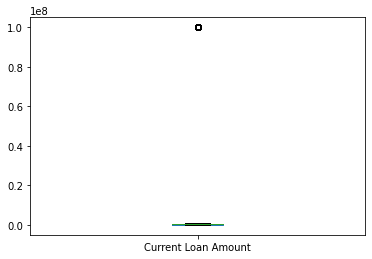

In [14]:
loan['Current Loan Amount'].plot.box()


In [15]:
q1,q2,q3 = np.percentile(loan["Current Loan Amount"],[25,50,75])
iqr = q3 -q1
print(iqr)

369171.0


In [16]:
lower = q1-(1.5 * iqr)
upper = q3 + 1.5 * iqr
print(lower)
print(upper)
print(min(loan['Current Loan Amount']))

-366239.5
1110444.5
21450.0


In [17]:
loan1= loan[(loan['Current Loan Amount']<1110444.5) & (loan['Current Loan Amount']>-366239.5)]

<AxesSubplot:>

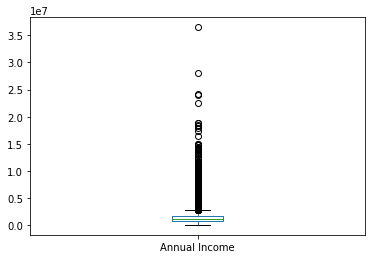

In [18]:
loan1['Annual Income'].plot.box()

In [19]:
q1,q2,q3 = np.percentile(loan1["Annual Income"],[25,50,75])
iqr = q3 -q1
print(iqr)

801116.0


In [20]:
lower = q1-(1.5 * iqr)
upper = q3 + 1.5 * iqr
print(lower)
print(upper)
print(min(loan1['Annual Income']))

-351120.0
2853344.0
76627.0


In [21]:
loan2= loan1[(loan1['Annual Income']<2853344.0) & (loan1['Annual Income']>-351120.0)]

In [22]:
loan=loan2

In [23]:
for k, v in loan[num].items():
        q1 = v.quantile(0.25)
        q3 = v.quantile(0.75)
        iqr = q3 - q1
        v_col = v[(v <= q1 - 1.5 * iqr) | (v >= q3 + 1.5 * iqr)]
        perc = np.shape(v_col)[0] * 100.0 / np.shape(loan)[0]
        print("Column %s's outliers =%d (%.2f%%)" % (k, np.shape(v_col)[0], perc))

Column Current Loan Amount's outliers =0 (0.00%)
Column Credit Score's outliers =2078 (3.39%)
Column Annual Income's outliers =919 (1.50%)
Column Monthly Debt's outliers =1469 (2.39%)
Column Years of Credit History's outliers =1943 (3.17%)
Column Months since last delinquent's outliers =8 (0.01%)
Column Number of Open Accounts's outliers =1737 (2.83%)
Column Number of Credit Problems's outliers =61338 (100.00%)
Column Current Credit Balance's outliers =3003 (4.90%)
Column Maximum Open Credit's outliers =3216 (5.24%)
Column Bankruptcies's outliers =61232 (99.83%)
Column Tax Liens's outliers =61333 (99.99%)


- We have used inter quartile range to keep the values within the 25th percentile and 75th percentile for the columns current loan amount and annual income.

# Missing Values

In [24]:
loan.isnull().sum()/len(loan.index)*100

Loan Status                      0.000000
Current Loan Amount              0.000000
Term                             0.000000
Credit Score                     0.000000
Annual Income                    0.000000
Years in current job             4.393687
Home Ownership                   0.000000
Purpose                          0.000000
Monthly Debt                     0.000000
Years of Credit History          0.000000
Months since last delinquent    52.522091
Number of Open Accounts          0.000000
Number of Credit Problems        0.000000
Current Credit Balance           0.000000
Maximum Open Credit              0.000000
Bankruptcies                     0.172813
Tax Liens                        0.008152
dtype: float64

- We can see there are so many missing values in the dataset. The above code is used to get percentage of missing values in the dataset. 

In [25]:
loan = loan.dropna(how='all')

In [26]:
loan.shape

(61338, 17)

In [27]:
loan = loan.drop(['Months since last delinquent'], axis=1)

- First we dropped all the samples which have null values in entire column. Generally we will drop the column if there are more than 50% of null values. Hence we dropped the 'Months since last delinquent'.

In [28]:
loan.isnull().sum()

Loan Status                     0
Current Loan Amount             0
Term                            0
Credit Score                    0
Annual Income                   0
Years in current job         2695
Home Ownership                  0
Purpose                         0
Monthly Debt                    0
Years of Credit History         0
Number of Open Accounts         0
Number of Credit Problems       0
Current Credit Balance          0
Maximum Open Credit             0
Bankruptcies                  106
Tax Liens                       5
dtype: int64

In [29]:
feature = ['Bankruptcies','Tax Liens']
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer = imputer.fit(loan[feature])
loan[feature] = imputer.transform(loan[feature])

In [30]:
loan.isnull().sum()

Loan Status                     0
Current Loan Amount             0
Term                            0
Credit Score                    0
Annual Income                   0
Years in current job         2695
Home Ownership                  0
Purpose                         0
Monthly Debt                    0
Years of Credit History         0
Number of Open Accounts         0
Number of Credit Problems       0
Current Credit Balance          0
Maximum Open Credit             0
Bankruptcies                    0
Tax Liens                       0
dtype: int64

- After removing samples with all columns nulls, we can still see huge null values in certain columns. We can try to impute values to those columns 

- The imputer which we have used above works only for continuos variables. For the column 'years in current job' we have got to use another method.

In [31]:
def impute_nan_most_frequent_category(loanFrame,ColName):

     most_frequent_category=loanFrame[ColName].mode()[0]

     loanFrame[ColName + "_Imputed"] = loanFrame[ColName]
     loanFrame[ColName + "_Imputed"].fillna(most_frequent_category,inplace=True)

for Columns in ['Years in current job']:
    impute_nan_most_frequent_category(loan,Columns)
    

In [32]:
loan[['Years in current job', 'Years in current job_Imputed']].head(10)

,Years in current job,Years in current job_Imputed
0,8 years,8 years
3,3 years,3 years
6,< 1 year,< 1 year
8,2 years,2 years
9,< 1 year,< 1 year
14,10+ years,10+ years
17,10+ years,10+ years
19,8 years,8 years
20,8 years,8 years
21,< 1 year,< 1 year


In [33]:
loan = loan.drop(['Years in current job'], axis = 1)

- The above function finds out the most frequent category and replace the null with it. Now we have got the imputed values, so we dropped the original column

In [34]:
loan['Years in current job_Imputed'].unique()

array(['8 years', '3 years', '< 1 year', '2 years', '10+ years',
       '4 years', '5 years', '1 year', '7 years', '6 years', '9 years'],
      dtype=object)

In [35]:
loan['Credit Score'].unique()

array([709., 721., 730., 678., 739., 727., 723., 747., 687., 750., 714.,
       724., 704., 688., 749., 729., 733., 725., 745., 720., 718., 682.,
       680., 737., 710., 598., 719., 652., 736., 644., 672., 699., 751.,
       694., 675., 748., 743., 666., 742., 705., 731., 712., 685., 717.,
       722., 618., 676., 692., 740., 746., 732., 649., 695., 744., 686.,
       637., 697., 706., 741., 715., 707., 738., 716., 651., 708., 698.,
       689., 735., 703., 693., 645., 691., 673., 700., 658., 657., 728.,
       674., 654., 681., 696., 668., 659., 647., 683., 670., 623., 711.,
       639., 671., 614., 713., 667., 701., 734., 615., 653., 664., 613.,
       726., 636., 702., 594., 656., 646., 669., 690., 641., 665., 677.,
       684., 655., 630., 679., 609., 603., 661., 643., 633., 629., 648.,
       663., 625., 662., 640., 660., 627., 611., 604., 638., 642., 621.,
       632., 602., 616., 597., 624., 635., 628., 596., 599., 606., 650.,
       626., 605., 600., 619., 589., 607., 608., 63

In [36]:
loan['Maximum Open Credit'].sort_values().to_frame().head(681)

,Maximum Open Credit
98018,4334.0
362,4334.0
66510,4334.0
97565,4334.0
21791,4444.0
...,...
77980,52646.0
33416,52646.0
28147,52800.0
19999,52800.0


In [37]:
loan['Loan Status'].value_counts()/len(loan)*100

Fully Paid     80.181943
Charged Off    19.818057
Name: Loan Status, dtype: float64

## Feature Engineering

In [38]:
values = []
for i in loan.loc[:,'Credit Score']:
    if i <= 579:
        values.append('Poor')
    elif i >= 580 and i <= 669:
        values.append('Fair')
    elif i >= 670 and i <= 739:
        values.append('Good')
    elif i >= 740 and i <= 779:
        values.append('Very Good')
    else:
        values.append('Exceptional')

In [39]:
loan['Credit Score'] = values

In [40]:
loan['Credit Score'].unique()

array(['Good', 'Very Good', 'Fair'], dtype=object)

In [41]:
loan['Number of Credit Problems'].unique()

array([ 1.,  0.,  2.,  5.,  4.,  7.,  3.,  6., 11., 15., 10.,  9.,  8.])

In [42]:
values = []
for i in loan.loc[:,'Number of Credit Problems']:
    if i == 0:
        values.append('No Problem')
    elif i >= 1 and i <= 5:
        values.append('Minimum')
    else:
        values.append('Maximum')

In [43]:
loan['Number of Credit Problems'] = values

In [44]:
loan['Years of Credit History'].unique()

array([17.2, 12. , 19.6, 22.6, 13.9, 24.7, 22. , 22.7, 17.4, 11.9, 15.7,
       17.5, 14.4, 22.3, 14. , 20. , 15.4, 14.6, 24.5, 28.8, 16.6, 14.5,
       21.6, 19.4, 18.6, 17.8, 14.1, 20.9, 36.6,  9.2, 16.1, 15. , 18.3,
       21.8, 18. , 15.1, 31.4,  6.4, 19. , 28.2, 12.2, 17. , 27.4, 20.4,
       31.3, 14.2, 25.9, 16. , 14.7, 13. , 23.3, 10. , 19.5, 17.9, 20.5,
       11. , 21.5, 14.9, 10.2, 12.5, 13.4,  9. , 23.4,  9.5, 34.4, 18.4,
       23.5, 14.3, 13.6, 50.1, 13.2, 33.1, 23.9, 24. , 29.2, 18.2, 44. ,
       15.6, 13.8, 30.5,  7.1,  6.6, 15.8, 16.5, 17.6, 36.3, 22.5, 19.7,
        8.6, 13.3, 15.5, 11.8, 10.8, 18.7, 30.9, 16.3,  4.9, 21.4, 10.3,
       18.5, 16.7, 15.9,  8.7, 11.1, 19.2, 23. , 21.3, 10.7, 33.7, 27. ,
       18.8, 11.4, 22.2, 13.7, 13.1, 15.3, 21.2, 20.8, 11.5, 20.6, 20.7,
        9.3, 14.8, 26.5, 36.4, 13.5, 30.6, 12.8, 23.8, 25.5, 38.5, 24.4,
       12.1, 12.4, 10.1, 12.9, 11.3,  7.5, 16.4, 20.2,  9.8, 27.2, 32.9,
       10.6,  8.2, 28.4, 21.9, 21.7, 48.7, 16.2, 32

In [45]:
values = []
for i in loan.loc[:,'Years of Credit History']:
    if i < 7:
        values.append('Short')
    elif i >= 7 and i <= 20:
        values.append('Very Good')
    else:
        values.append('Exceptional')

In [46]:
loan['Years of Credit History'] = values

In [47]:
loan['Bankruptcies'].unique()

array([1.        , 0.        , 2.        , 3.        , 0.12290959,
       4.        , 5.        , 7.        , 6.        ])

In [48]:
values = []
for i in loan.loc[:,'Bankruptcies']:
    if i == 0:
        values.append('No Bankruptcies')
    elif i >= 1 and i <= 4:
        values.append('Low Bankruptcies')
    else:
        values.append('High Bankruptcies')

In [49]:
loan['Bankruptcies'] = values

In [50]:
loan['Tax Liens'].unique()

array([ 0.        ,  1.        ,  2.        ,  4.        ,  3.        ,
        6.        ,  5.        ,  0.02763602, 11.        , 15.        ,
        7.        , 10.        ,  9.        ])

In [51]:
values = []
for i in loan.loc[:,'Tax Liens']:
    if i == 0:
        values.append('No Tax Liens')
    elif i >= 1 and i <= 4:
        values.append('Low Tax Liens')
    else:
        values.append('High Tax Liens')

In [52]:
loan['Tax Liens'] = values

In [53]:
values = []
for i in loan.loc[:,'Annual Income']:
    if i <= 8.368122e+05:
        values.append('Lower Class')
    elif i > 8.368122e+05 and i <= 1.560684e+06:
        values.append('Middle Class')
    else:
        values.append('Upper Class')

In [54]:
loan["Class"] = values

In [55]:
loan.drop(columns=['Annual Income'], inplace=True)

- We have converted the numeric values of 'credit score', 'Tax Liens', 'Bankruptcies', 'years of Credit History', 'Annual Income' and 'Number of Credit Problems' to the categorical values. 

In [56]:
loan.shape

(61338, 16)

# Data Visualisation

<AxesSubplot:xlabel='Term', ylabel='count'>

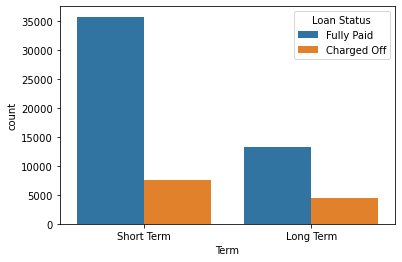

In [57]:
sns.countplot(x='Term', hue="Loan Status", data=loan)

- From the bar graph we can say that the fully paid(0) and charged off(1), in both the short term and long term the charged off people are less than the fully paid, in short term we can observe that there is a huge difference between the charged off and fully paid, in Long term also the full paid people are more than the charged off but comparatively with the short time the difference is less beween fully paid and charged off.

<AxesSubplot:xlabel='Home Ownership', ylabel='count'>

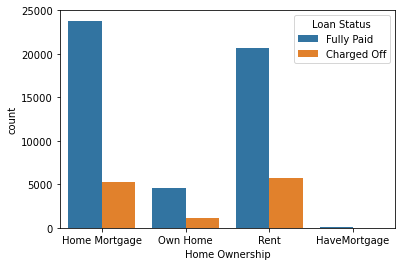

In [58]:
sns.countplot(x='Home Ownership', hue="Loan Status", data=loan)

- From the bar graph we can say that the in all the four categories from the home ownership feature we can say that fullpaid is more when compared to charged off, in "have mortage" we can observe we have very neglible people for charged off and fully paid,for "Home mortage" and "rent" there is a huge difference between fully paid and charged off in "own home" too the the charged off is more comapred to fully paid but compartively with "Home mortage" and "rent" it is less. 

<AxesSubplot:xlabel='count', ylabel='Purpose'>

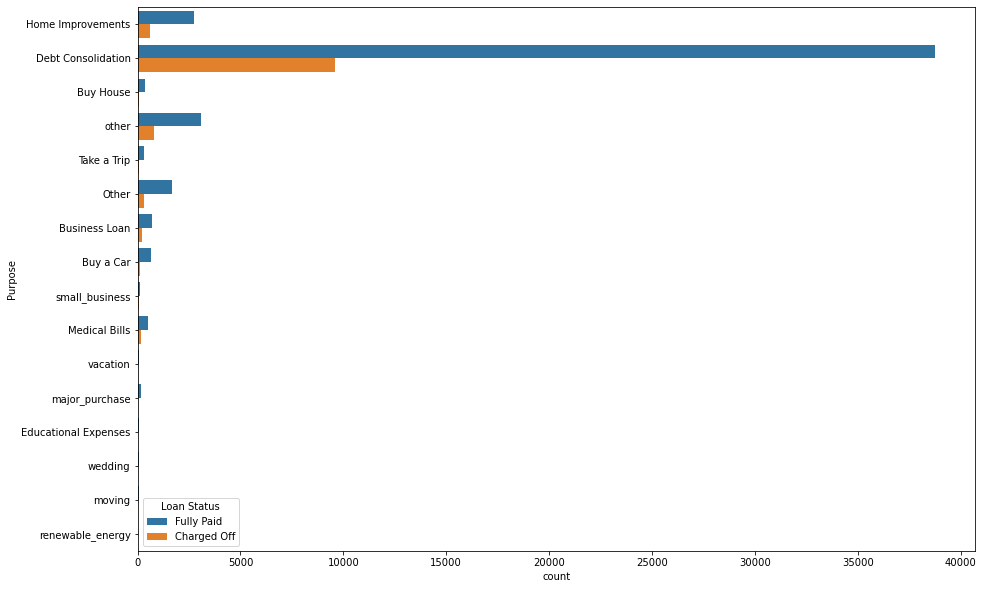

In [59]:
plt.figure(figsize=(15,10))
sns.countplot(y='Purpose', hue="Loan Status", data=loan)
#plt.yticks(rotation=90);

- Our main aim from the above chunk is to get for what is the purpose people are taking loans and the loan staus of that particular category, from all the categories more people are taking loans for the "Debt Consolidation", "Home improvements" in both of these the fully paid is more when compared to charged off.for the "small business", "vacation","education expenses","moving","renewable_energy" we have very negligible data.

<AxesSubplot:xlabel='count', ylabel='Years in current job_Imputed'>

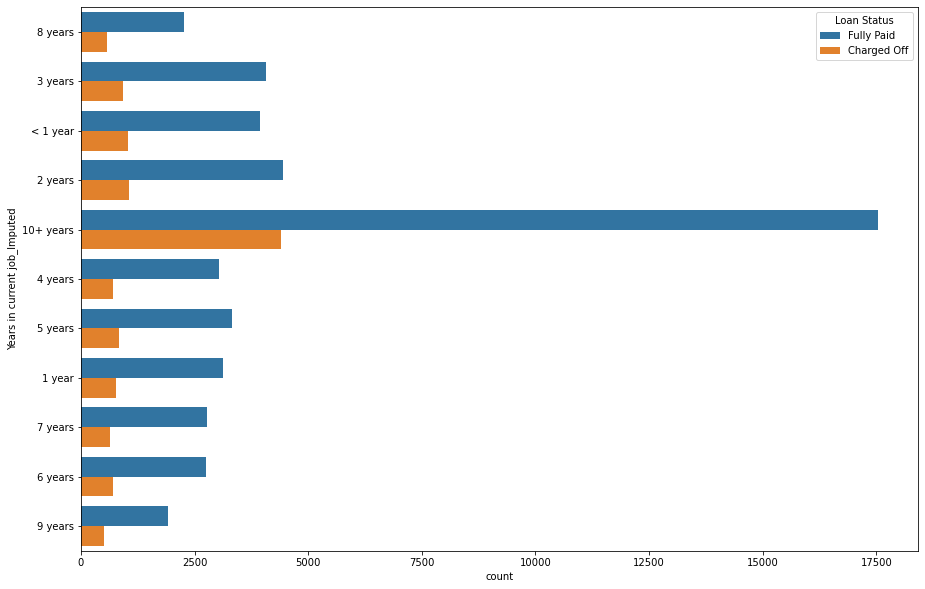

In [60]:
plt.figure(figsize=(15,10))
sns.countplot(y='Years in current job_Imputed', hue="Loan Status", data=loan)

- Our aim in this graph is to use the "Years in current job_Imputed" feature and see the loan status, here we observed that the people with more than 10+years of experirence are paying loans more, by seeing the bar graph we can say that the people with the less than 10 years of experience are paying loan as well, we can see the full paid is more compared to charged off in all categories.

<AxesSubplot:xlabel='Number of Credit Problems', ylabel='count'>

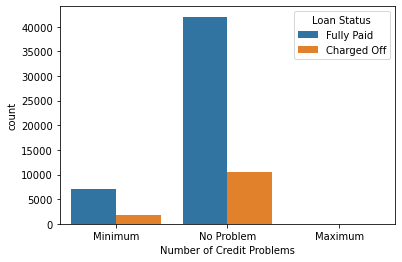

In [61]:
sns.countplot(x='Number of Credit Problems', hue="Loan Status", data=loan)

The above clustered column chart shows the number of credit problems, we can clearly observe that most of the people does not have any credit problem, also we can see that most of people have fully paid there loan as compared to charged off. There were also few people who had minimum problems but still they fully paid there loans when compared to charged off.

<AxesSubplot:xlabel='Credit Score', ylabel='count'>

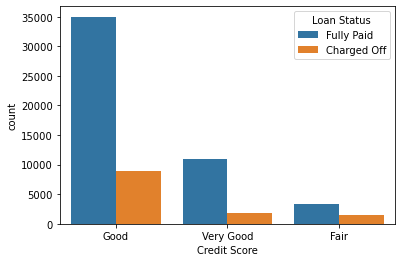

In [62]:
sns.countplot(x='Credit Score', hue="Loan Status", data=loan)

The above visualization is for the credit score, we observe that most of the people who fully paid loans have a good credit score. 

<AxesSubplot:xlabel='Years of Credit History', ylabel='count'>

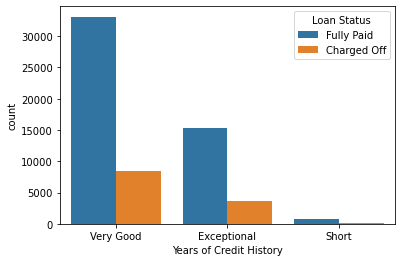

In [63]:
sns.countplot(x='Years of Credit History', hue="Loan Status", data=loan)

The above visualization is for the years of credit history. We can see from the visualization that the most of customers that are with very good credit history have fully paid off there loans, followed by Exceptional years of credit history that have maximum people who fully paid off there loans and few with charged off. People with short credit history took very few loans and most of them have paid off there loans and negligible people haven’t

<AxesSubplot:xlabel='Bankruptcies', ylabel='count'>

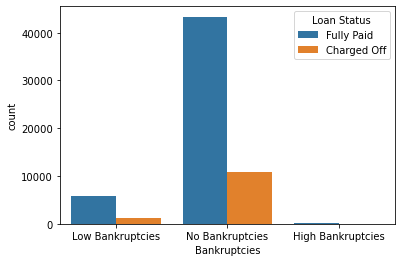

In [64]:
sns.countplot(x='Bankruptcies', hue="Loan Status", data=loan)

From the above we observed that  most people with no bankruptcies have paid off there loans, there are few people with charged off but there number is quite less than the people who have already paid there loans. Also we received the similar observations for low bankruptcies. There was negligible amount of data for the people with High bankruptcies but still we can see that people paid off there loans in that category.

<AxesSubplot:xlabel='Tax Liens', ylabel='count'>

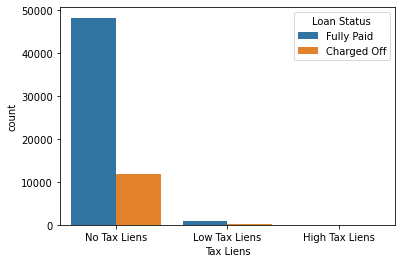

In [65]:
sns.countplot(x='Tax Liens', hue="Loan Status", data=loan)

The above visualization is for the tax liens, we observed that people fully paid of there loans with No Tax lines, but still there were few people with charged off, but they were very less as compared to the people who paid off there loans. There is no data for this for High tax lines for us to visualize, also there is less amount of data for low tax liens.

In [66]:
import plotly.express as px
fig = px.box(loan, x="Purpose", y="Current Loan Amount")
fig.show()

- In this we mentioned the "purpose" and the "current loan amount" we have more outliers in the "medical bills","major_pruchase","other","Buy a car", "Take a trip", "Moving"

In [67]:
fig = px.histogram(loan, x="Class", y="Current Loan Amount", color="Term")
fig.show()

In [68]:
loan.head(10)

,Loan Status,Current Loan Amount,Term,Credit Score,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens,Years in current job_Imputed,Class
0,Fully Paid,445412.0,Short Term,Good,Home Mortgage,Home Improvements,5214.74,Very Good,6.0,Minimum,228190.0,416746.0,Low Bankruptcies,No Tax Liens,8 years,Middle Class
3,Fully Paid,347666.0,Long Term,Good,Own Home,Debt Consolidation,8741.90,Very Good,9.0,No Problem,256329.0,386958.0,No Bankruptcies,No Tax Liens,3 years,Lower Class
6,Fully Paid,217646.0,Short Term,Good,Home Mortgage,Debt Consolidation,10855.08,Very Good,13.0,Minimum,122170.0,272052.0,Low Bankruptcies,No Tax Liens,< 1 year,Middle Class
8,Fully Paid,548746.0,Short Term,Good,Rent,Debt Consolidation,18660.28,Exceptional,4.0,No Problem,437171.0,555038.0,No Bankruptcies,No Tax Liens,2 years,Upper Class
9,Fully Paid,215952.0,Short Term,Good,Rent,Debt Consolidation,39277.75,Very Good,20.0,No Problem,669560.0,1021460.0,No Bankruptcies,No Tax Liens,< 1 year,Middle Class
14,Fully Paid,234124.0,Short Term,Good,Rent,Debt Consolidation,14211.24,Exceptional,10.0,Minimum,28291.0,107052.0,Low Bankruptcies,No Tax Liens,10+ years,Lower Class
17,Fully Paid,666204.0,Long Term,Good,Home Mortgage,Debt Consolidation,17612.24,Exceptional,15.0,No Problem,813694.0,2004618.0,No Bankruptcies,No Tax Liens,10+ years,Upper Class
19,Fully Paid,390390.0,Short Term,Very Good,Home Mortgage,Home Improvements,2478.55,Exceptional,6.0,No Problem,121182.0,801812.0,No Bankruptcies,No Tax Liens,8 years,Upper Class
20,Charged Off,317108.0,Long Term,Good,Rent,Debt Consolidation,9632.81,Very Good,4.0,No Problem,60287.0,126940.0,No Bankruptcies,No Tax Liens,8 years,Middle Class
21,Fully Paid,128238.0,Short Term,Very Good,Rent,Debt Consolidation,13202.15,Very Good,7.0,No Problem,131936.0,458788.0,No Bankruptcies,No Tax Liens,< 1 year,Middle Class


## Categorical Variable Treatment

In [69]:
cat=[x for x in loan.columns if loan[x].dtypes=='O']
loan[cat]

,Loan Status,Term,Credit Score,Home Ownership,Purpose,Years of Credit History,Number of Credit Problems,Bankruptcies,Tax Liens,Years in current job_Imputed,Class
0,Fully Paid,Short Term,Good,Home Mortgage,Home Improvements,Very Good,Minimum,Low Bankruptcies,No Tax Liens,8 years,Middle Class
3,Fully Paid,Long Term,Good,Own Home,Debt Consolidation,Very Good,No Problem,No Bankruptcies,No Tax Liens,3 years,Lower Class
6,Fully Paid,Short Term,Good,Home Mortgage,Debt Consolidation,Very Good,Minimum,Low Bankruptcies,No Tax Liens,< 1 year,Middle Class
8,Fully Paid,Short Term,Good,Rent,Debt Consolidation,Exceptional,No Problem,No Bankruptcies,No Tax Liens,2 years,Upper Class
9,Fully Paid,Short Term,Good,Rent,Debt Consolidation,Very Good,No Problem,No Bankruptcies,No Tax Liens,< 1 year,Middle Class
...,...,...,...,...,...,...,...,...,...,...,...
99991,Fully Paid,Short Term,Good,Rent,Debt Consolidation,Exceptional,Minimum,Low Bankruptcies,No Tax Liens,10+ years,Upper Class
99994,Fully Paid,Short Term,Good,Home Mortgage,Other,Very Good,No Problem,No Bankruptcies,No Tax Liens,1 year,Lower Class
99995,Fully Paid,Short Term,Good,Own Home,other,Exceptional,No Problem,No Bankruptcies,No Tax Liens,7 years,Lower Class
99997,Fully Paid,Short Term,Very Good,Rent,Debt Consolidation,Very Good,Minimum,Low Bankruptcies,No Tax Liens,6 years,Middle Class


### Encoding Ordinal Variables with Ordinal Encoders

In [70]:
import category_encoders as ce

encoder = ce.OrdinalEncoder(mapping=[{'col': 'Years in current job_Imputed', 'mapping': {'< 1 year':1,'1 year':2,'2 years':3,'3 years':4,'4 years':5,'5 years':6,'6 years':7,'7 years':8,'8 years':9,'9 years':10,'10+ years':11}},
                                    {'col': 'Class', 'mapping': {'Lower Class':1,'Middle Class':2,'Upper Class':3}},
                                    {'col': 'Credit Score', 'mapping': {'Fair':1,'Good':2,'Very Good':3}},
                                    {'col': 'Years of Credit History', 'mapping': {'Short':1,'Very Good':2, 'Exceptional':3}},
                                    {'col': 'Number of Credit Problems', 'mapping': {'Maximum':1,'Minimum':2, 'No Problem':3}},
                                    {'col': 'Bankruptcies', 'mapping': {'No Bankruptcies':1,'Low Bankruptcies':2, 'High Bankruptcies':3}},
                                    {'col': 'Tax Liens', 'mapping': {'No Tax Liens':1,'Low Tax Liens':2, 'High Tax Liens':3}},
                                    {'col': 'Term', 'mapping': {'Short Term':1,'Long Term':2}}])

encoder.fit(loan)
loan = encoder.transform(loan)

- ordinal variable {Term, Years in current job, Class, Credit Score, years of credit history, number of credit problems, bankruptcies, tax liens}
- nomial variable {Purpose, Home Ownership}

In [71]:
loan['Loan Status'].replace(('Fully Paid','Charged Off'),(0,1),inplace=True)


In [72]:
loan.head(10)

,Loan Status,Current Loan Amount,Term,Credit Score,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens,Years in current job_Imputed,Class
0,0,445412.0,1,2,Home Mortgage,Home Improvements,5214.74,2,6.0,2,228190.0,416746.0,2,1,9,2
3,0,347666.0,2,2,Own Home,Debt Consolidation,8741.90,2,9.0,3,256329.0,386958.0,1,1,4,1
6,0,217646.0,1,2,Home Mortgage,Debt Consolidation,10855.08,2,13.0,2,122170.0,272052.0,2,1,1,2
8,0,548746.0,1,2,Rent,Debt Consolidation,18660.28,3,4.0,3,437171.0,555038.0,1,1,3,3
9,0,215952.0,1,2,Rent,Debt Consolidation,39277.75,2,20.0,3,669560.0,1021460.0,1,1,1,2
14,0,234124.0,1,2,Rent,Debt Consolidation,14211.24,3,10.0,2,28291.0,107052.0,2,1,11,1
17,0,666204.0,2,2,Home Mortgage,Debt Consolidation,17612.24,3,15.0,3,813694.0,2004618.0,1,1,11,3
19,0,390390.0,1,3,Home Mortgage,Home Improvements,2478.55,3,6.0,3,121182.0,801812.0,1,1,9,3
20,1,317108.0,2,2,Rent,Debt Consolidation,9632.81,2,4.0,3,60287.0,126940.0,1,1,9,2
21,0,128238.0,1,3,Rent,Debt Consolidation,13202.15,2,7.0,3,131936.0,458788.0,1,1,1,2


### Encoding nominal variables with frequency encoding

In [73]:
loan_frequency_map = loan.Purpose.value_counts().to_dict()
loan_frequency_map

{'Debt Consolidation': 48347,
 'other': 3890,
 'Home Improvements': 3369,
 'Other': 1987,
 'Business Loan': 921,
 'Buy a Car': 741,
 'Medical Bills': 671,
 'Buy House': 413,
 'Take a Trip': 366,
 'major_purchase': 203,
 'small_business': 163,
 'moving': 84,
 'wedding': 61,
 'vacation': 59,
 'Educational Expenses': 57,
 'renewable_energy': 6}

In [74]:
loan.Purpose = loan.Purpose.map(loan_frequency_map)

In [75]:
loan1_frequency_map = loan['Home Ownership'].value_counts().to_dict()
loan1_frequency_map

{'Home Mortgage': 29037, 'Rent': 26413, 'Own Home': 5751, 'HaveMortgage': 137}

In [76]:
loan['Home Ownership'] = loan['Home Ownership'].map(loan1_frequency_map)

In [77]:
loan.head()

,Loan Status,Current Loan Amount,Term,Credit Score,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens,Years in current job_Imputed,Class
0,0,445412.0,1,2,29037,3369,5214.74,2,6.0,2,228190.0,416746.0,2,1,9,2
3,0,347666.0,2,2,5751,48347,8741.90,2,9.0,3,256329.0,386958.0,1,1,4,1
6,0,217646.0,1,2,29037,48347,10855.08,2,13.0,2,122170.0,272052.0,2,1,1,2
8,0,548746.0,1,2,26413,48347,18660.28,3,4.0,3,437171.0,555038.0,1,1,3,3
9,0,215952.0,1,2,26413,48347,39277.75,2,20.0,3,669560.0,1021460.0,1,1,1,2


In [78]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61338 entries, 0 to 99998
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Loan Status                   61338 non-null  int64  
 1   Current Loan Amount           61338 non-null  float64
 2   Term                          61338 non-null  int32  
 3   Credit Score                  61338 non-null  int32  
 4   Home Ownership                61338 non-null  int64  
 5   Purpose                       61338 non-null  int64  
 6   Monthly Debt                  61338 non-null  float64
 7   Years of Credit History       61338 non-null  int32  
 8   Number of Open Accounts       61338 non-null  float64
 9   Number of Credit Problems     61338 non-null  int32  
 10  Current Credit Balance        61338 non-null  float64
 11  Maximum Open Credit           61338 non-null  float64
 12  Bankruptcies                  61338 non-null  int32  
 13  T

In [79]:
loan.shape

(61338, 16)

## Model Building

In [80]:
from sklearn.model_selection import train_test_split
labels = loan['Loan Status']
features = loan.drop(['Loan Status'],axis=1)


In [81]:
train_loan, X_test, train_labels, y_test = train_test_split(features, labels, test_size=0.2, random_state=808)
X_train, X_val, y_train, y_val = train_test_split(train_loan, train_labels, test_size=0.15, random_state=808)


In [82]:
print(X_train.shape)
print(y_train.shape)
print(X_val.shape)
print(y_val.shape)
print(X_test.shape)
print(y_test.shape)

(41709, 15)
(41709,)
(7361, 15)
(7361,)
(12268, 15)
(12268,)


In [83]:
X_train.corr()

,Current Loan Amount,Term,Credit Score,Home Ownership,Purpose,Monthly Debt,Years of Credit History,Number of Open Accounts,Number of Credit Problems,Current Credit Balance,Maximum Open Credit,Bankruptcies,Tax Liens,Years in current job_Imputed,Class
Current Loan Amount,1.000000,0.439203,-0.158809,0.068697,0.195495,0.428893,0.115607,0.199923,0.093983,0.374717,0.032039,-0.102067,0.005837,0.108894,0.463061
Term,0.439203,1.000000,-0.372849,0.039458,0.057689,0.181107,0.036074,0.088246,0.028360,0.138266,0.006695,-0.036248,-0.010323,0.058445,0.160393
Credit Score,-0.158809,-0.372849,1.000000,0.018701,0.043803,-0.073083,0.071581,-0.011607,0.071764,0.001328,0.031592,-0.056119,-0.020754,-0.017688,0.031653
Home Ownership,0.068697,0.039458,0.018701,1.000000,0.048282,0.078331,0.001929,0.039056,0.007271,0.038655,-0.003226,-0.006688,-0.005410,0.015854,0.118790
Purpose,0.195495,0.057689,0.043803,0.048282,1.000000,0.128805,0.016770,0.119102,0.015982,0.115328,-0.006737,-0.012965,-0.007260,0.036150,0.016917
Monthly Debt,0.428893,0.181107,-0.073083,0.078331,0.128805,1.000000,0.148657,0.424938,0.064604,0.463456,0.038109,-0.076959,0.015148,0.128191,0.531436
Years of Credit History,0.115607,0.036074,0.071581,0.001929,0.016770,0.148657,1.000000,0.094798,-0.060656,0.190247,0.034319,0.063639,0.010108,0.202358,0.158966
Number of Open Accounts,0.199923,0.088246,-0.011607,0.039056,0.119102,0.424938,0.094798,1.000000,0.007957,0.255411,0.040095,-0.021712,0.010388,0.043774,0.207730
Number of Credit Problems,0.093983,0.028360,0.071764,0.007271,0.015982,0.064604,-0.060656,0.007957,1.000000,0.156100,0.015511,-0.849012,-0.342564,-0.066655,0.028861
Current Credit Balance,0.374717,0.138266,0.001328,0.038655,0.115328,0.463456,0.190247,0.255411,0.156100,1.000000,0.130087,-0.148541,-0.029372,0.108657,0.317504


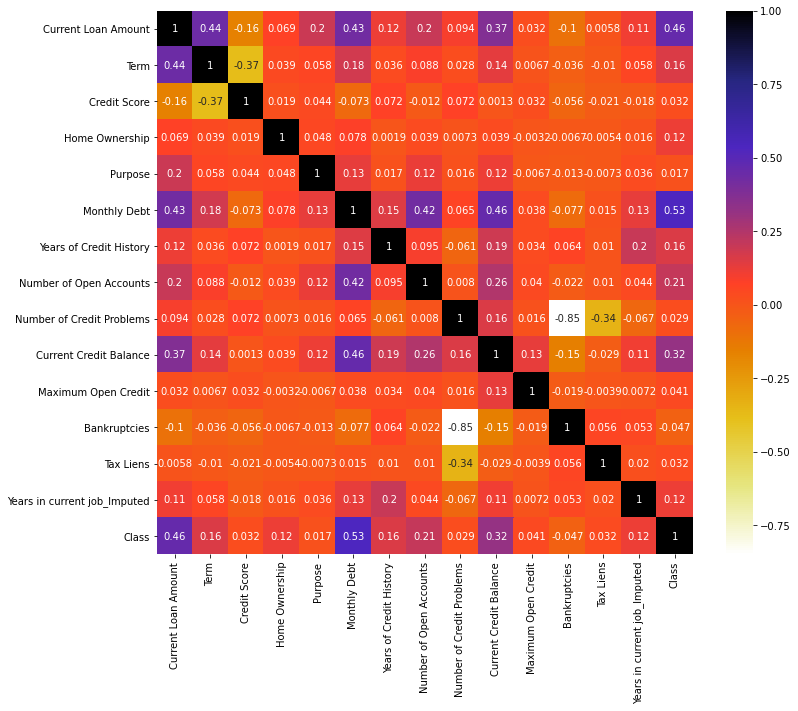

In [84]:
plt.figure(figsize=(12,10))
cor = X_train.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r)
plt.show()

In [85]:
def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [86]:

corr_features = correlation(X_train, 0.8)
len(set(corr_features))

1

In [87]:
corr_features

{'Bankruptcies'}

In [88]:
X_train.drop(corr_features,axis=1,inplace=True)
X_test.drop(corr_features,axis=1,inplace=True)
X_val.drop(corr_features,axis=1,inplace=True)

C:\Users\saisa\Anaconda3\envs\DAB-300\lib\site-packages\pandas\core\frame.py:4170: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [89]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
X_val_scaled = scaler.transform(X_val)



In [90]:
unique, count = np.unique(y_train, return_counts=True)
labels_dict_value_count = { k:v for (k,v) in zip(unique, count)}
labels_dict_value_count


{0: 33485, 1: 8224}

In [91]:
from imblearn.over_sampling import SMOTENC

sm = SMOTENC(categorical_features=True, random_state=12)
X_train_scaled, y_train = sm.fit_sample(X_train_scaled, y_train)

unique, count = np.unique(y_train, return_counts=True)
labels_dict_value_count = { k:v for (k,v) in zip(unique, count)}
labels_dict_value_count

{0: 33485, 1: 33485}

### Logistic Regression

In [92]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score

clf_L = LogisticRegression(random_state=808)
clf_L.fit(X_train_scaled, y_train)
y_val_pred = clf_L.predict(X_val_scaled)
accuracy_score(y_val,y_val_pred)


0.5549517728569487

In [93]:
import sklearn
from sklearn.model_selection import GridSearchCV
params_lr = {'max_iter':(50, 100, 150)} 
grid_search_lr = GridSearchCV(LogisticRegression(random_state=590), param_grid = params_lr,cv=10,scoring = 'accuracy', n_jobs = -1)
grid_search_lr = grid_search_lr.fit(X_train_scaled, y_train)
accuracy_lr = grid_search_lr.best_score_
print("Val score is "+str(grid_search_lr.score(X_val_scaled,y_val)))
print("Best parameters:"+str(grid_search_lr.best_params_))
print("Best grid search score:"+str(accuracy_lr))
print("Best estimator:"+str(grid_search_lr.best_estimator_))

Val score is 0.5549517728569487
Best parameters:{'max_iter': 100}
Best grid search score:0.5753023741974018
Best estimator:LogisticRegression(random_state=590)


In [94]:
clf_lr=LogisticRegression(max_iter=100, random_state=808)
clf_lr.fit(X_train_scaled, y_train)
y_pred_lr = clf_lr.predict(X_test_scaled)

In [95]:
from sklearn.metrics import accuracy_score
acc_lr = accuracy_score(y_test,y_pred_lr)
acc_lr

0.5719758721878057

In [96]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, y_pred_lr, labels=[1, 0])
cm

array([[1444,  999],
       [4252, 5573]], dtype=int64)

<AxesSubplot:>

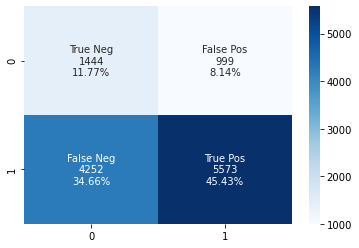

In [97]:
import seaborn as sns
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')

In [98]:
from sklearn.metrics import classification_report
report = classification_report(y_test, y_pred_lr)
print(report)

              precision    recall  f1-score   support

           0       0.85      0.57      0.68      9825
           1       0.25      0.59      0.35      2443

    accuracy                           0.57     12268
   macro avg       0.55      0.58      0.52     12268
weighted avg       0.73      0.57      0.62     12268



In [99]:
from sklearn.metrics import matthews_corrcoef
mcc_lr = matthews_corrcoef(y_test, y_pred_lr)
mcc_lr

0.12676034526580152

In [100]:
from sklearn.metrics import balanced_accuracy_score
bcr_lr=balanced_accuracy_score(y_test, y_pred_lr)
bcr_lr

0.5791515041677994

### Random Forest Classifier

In [101]:
from sklearn.ensemble import RandomForestClassifier
clf_r = RandomForestClassifier(random_state = 808)
clf_r.fit(X_train_scaled, y_train)
y_val_pred = clf_r.predict(X_val_scaled)
accuracy_score(y_val,y_val_pred)

0.7532943893492732

In [102]:
params_r = {'max_depth': (30,35,37),
        'min_samples_leaf':(1,5,9), 'min_samples_split':(1,3,5)} 
grd_r = GridSearchCV(RandomForestClassifier(random_state = 808),params_r,scoring = 'accuracy',  cv=5, n_jobs=-1)
grd_r = grd_r.fit(X_train_scaled, y_train)
accuracy_r = grd_r.best_score_
print("Val score is "+str(grd_r.score(X_val_scaled,y_val)))
print("Best parameters:"+str(grd_r.best_params_))
print("Best grid search score:"+str(accuracy_r))
print("Best estimator:"+str(grd_r.best_estimator_))

Val score is 0.7500339627767967
Best parameters:{'max_depth': 37, 'min_samples_leaf': 1, 'min_samples_split': 3}
Best grid search score:0.8316410332984919
Best estimator:RandomForestClassifier(max_depth=37, min_samples_split=3, random_state=808)


In [103]:
clf_ra = RandomForestClassifier(max_depth=37,min_samples_leaf=1,min_samples_split=3,random_state = 808)
clf_ra.fit(X_train_scaled, y_train)
y_pred_ra = clf_ra.predict(X_test_scaled)

In [104]:
acc_ra = accuracy_score(y_test,y_pred_ra)
acc_ra

0.7548907727420933

In [105]:
cm = confusion_matrix(y_test, y_pred_ra, labels=[1, 0])
cm

array([[ 638, 1805],
       [1202, 8623]], dtype=int64)

<AxesSubplot:>

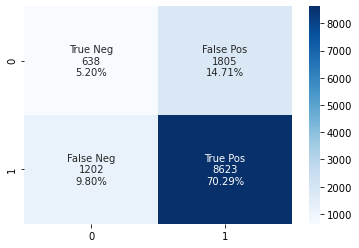

In [106]:
import seaborn as sns
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')

In [107]:
report = classification_report(y_test, y_pred_ra)
print(report)

              precision    recall  f1-score   support

           0       0.83      0.88      0.85      9825
           1       0.35      0.26      0.30      2443

    accuracy                           0.75     12268
   macro avg       0.59      0.57      0.57     12268
weighted avg       0.73      0.75      0.74     12268



In [108]:
mcc_ra=matthews_corrcoef(y_test, y_pred_ra)
mcc_ra

0.15525651387583195

In [109]:
bcr_ra=balanced_accuracy_score(y_test, y_pred_ra)
bcr_ra

0.5694066757698946

### AdaBoost Classifier

In [110]:
from sklearn.ensemble import AdaBoostClassifier
clf_a = AdaBoostClassifier(random_state = 808)
clf_a.fit(X_train_scaled, y_train)
y_val_pred = clf_a.predict(X_val_scaled)
accuracy_score(y_val,y_val_pred)

0.6337454150251325

In [111]:
params_r = {'n_estimators': (100, 150, 200),
        'learning_rate':(0.001,0.01,0.1,1)} 
grd_r = GridSearchCV(AdaBoostClassifier(random_state = 808),params_r,scoring = 'accuracy',  cv=10, n_jobs=-1)
grd_r = grd_r.fit(X_train_scaled, y_train)
accuracy_r = grd_r.best_score_
print("Val score is "+str(grd_r.score(X_val_scaled,y_val)))
print("Best parameters:"+str(grd_r.best_params_))
print("Best grid search score:"+str(accuracy_r))
print("Best estimator:"+str(grd_r.best_estimator_))

Val score is 0.7288411900556989
Best parameters:{'learning_rate': 1, 'n_estimators': 200}
Best grid search score:0.7633567268926384
Best estimator:AdaBoostClassifier(learning_rate=1, n_estimators=200, random_state=808)


In [112]:
clf_a = AdaBoostClassifier(n_estimators=200, learning_rate=1,random_state = 808)
clf_a.fit(X_train_scaled, y_train)
y_pred_a = clf_a.predict(X_test_scaled)

In [113]:
acc_a = accuracy_score(y_test,y_pred_a)
acc_a

0.7372024779915226

In [114]:
cm = confusion_matrix(y_test, y_pred_a, labels=[1, 0])
cm

array([[ 595, 1848],
       [1376, 8449]], dtype=int64)

<AxesSubplot:>

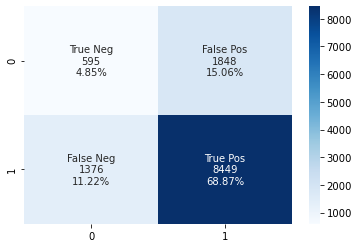

In [115]:
import seaborn as sns
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')

In [116]:
report = classification_report(y_test, y_pred_a)
print(report)

              precision    recall  f1-score   support

           0       0.82      0.86      0.84      9825
           1       0.30      0.24      0.27      2443

    accuracy                           0.74     12268
   macro avg       0.56      0.55      0.55     12268
weighted avg       0.72      0.74      0.73     12268



In [117]:
mcc_a=matthews_corrcoef(y_test, y_pred_a)
mcc_a

0.11255857377869143

In [118]:
bcr_a=balanced_accuracy_score(y_test, y_pred_a)
bcr_a

0.5517510590053734

### Bagging Classifier

In [119]:
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
clf_B = BaggingClassifier(RandomForestClassifier(random_state=808))
clf_B.fit(X_train_scaled, y_train)
y_val_pred = clf_B.predict(X_val_scaled)
accuracy_score(y_val,y_val_pred)

0.7503056649911697

In [120]:
clf_B = BaggingClassifier(RandomForestClassifier(max_depth=37,min_samples_leaf=1,min_samples_split=3,random_state=808))
clf_B.fit(X_train_scaled, y_train)
y_pred_B = clf_B.predict(X_test_scaled)

In [121]:
acc_B = accuracy_score(y_test,y_pred_B)
acc_B

0.7602706227583959

In [122]:
cm = confusion_matrix(y_test, y_pred_B, labels=[1, 0])
cm

array([[ 639, 1804],
       [1137, 8688]], dtype=int64)

<AxesSubplot:>

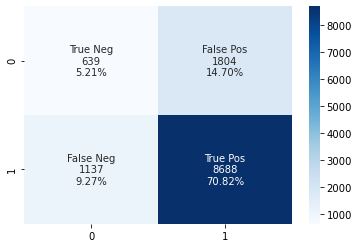

In [123]:
import seaborn as sns
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')

In [124]:
report = classification_report(y_test, y_pred_B)
print(report)

              precision    recall  f1-score   support

           0       0.83      0.88      0.86      9825
           1       0.36      0.26      0.30      2443

    accuracy                           0.76     12268
   macro avg       0.59      0.57      0.58     12268
weighted avg       0.73      0.76      0.75     12268



In [125]:
mcc_B=matthews_corrcoef(y_test, y_pred_B)
mcc_B

0.16551961299667528

In [126]:
bcr_B=balanced_accuracy_score(y_test, y_pred_ra)
bcr_B

0.5694066757698946

### Artificial Neural Network

In [127]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Dropout
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import GridSearchCV

Using TensorFlow backend.


Train on 66970 samples, validate on 7361 samples
Epoch 1/20
66970/66970 [==============================] - 1s 9us/step - loss: 1.0971 - accuracy: 0.5562 - val_loss: 0.9045 - val_accuracy: 0.5416
Epoch 2/20
66970/66970 [==============================] - 1s 8us/step - loss: 0.8047 - accuracy: 0.5725 - val_loss: 0.7297 - val_accuracy: 0.5836
Epoch 3/20
66970/66970 [==============================] - 1s 8us/step - loss: 0.7153 - accuracy: 0.5742 - val_loss: 0.6911 - val_accuracy: 0.5641
Epoch 4/20
66970/66970 [==============================] - 1s 9us/step - loss: 0.6908 - accuracy: 0.5756 - val_loss: 0.6574 - val_accuracy: 0.5992
Epoch 5/20
66970/66970 [==============================] - 1s 8us/step - loss: 0.6846 - accuracy: 0.5716 - val_loss: 0.6885 - val_accuracy: 0.5332
Epoch 6/20
66970/66970 [==============================] - 0s 7us/step - loss: 0.6814 - accuracy: 0.5769 - val_loss: 0.6267 - val_accuracy: 0.6685
Epoch 7/20
66970/66970 [==============================] - 0s 7us/step - los

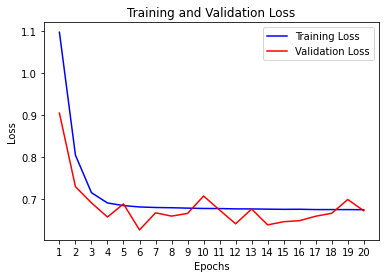

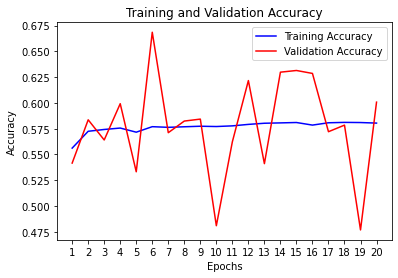

Testing loss and accuracy of the model is  [0.6686426849096265, 0.6053146123886108]


In [138]:
from keras.regularizers import l2
from keras.optimizers import Adam

model= Sequential()
model.add(Dense(32, kernel_initializer="he_uniform", activation= "relu", kernel_regularizer=l2(0.01)))
model.add(Dense(64, kernel_initializer="he_uniform", activation= "relu"))
model.add(Dense(128, kernel_initializer="he_uniform", activation= "relu"))
model.add(Dropout(0.3))
model.add(Dense(1, activation= "sigmoid"))
model.compile(optimizer=Adam(learning_rate=0.001), loss="binary_crossentropy", metrics=["accuracy"])

history = model.fit(X_train_scaled, y_train.values, epochs=20, batch_size=256, validation_data=(X_val_scaled, y_val.values), verbose=1)
history.history.keys()
import matplotlib.pyplot as plt 

history_dict = history.history

loss_values = history_dict['loss']  
val_loss_values = history_dict['val_loss']

#Plotting loss & accuracy of training and validation datasets
epochs = range(1, len(loss_values)+1) 
# code to plot the results
plt.plot(epochs, loss_values, 'b', label="Training Loss")
plt.plot(epochs, val_loss_values, 'r', label="Validation Loss")
plt.title("Training and Validation Loss")
plt.xlabel("Epochs")
plt.xticks(epochs)
plt.ylabel("Loss")
plt.legend()
plt.show()

import matplotlib.pyplot as plt 

history_dict = history.history

acc_values = history_dict['accuracy']
val_acc_values = history_dict['val_accuracy']

plt.plot(epochs, acc_values, 'b', label="Training Accuracy")
plt.plot(epochs, val_acc_values, 'r', label="Validation Accuracy")
plt.title("Training and Validation Accuracy")
plt.xlabel("Epochs")
plt.xticks(epochs)
plt.ylabel("Accuracy")
plt.legend()
plt.show()

#Testing accuracy
score = model.evaluate(X_test_scaled, y_test.values, verbose=0)
print('Testing loss and accuracy of the model is ', score)

ANN is not performing that great, even after trying out many combinations in hyperparameters. We think ANN is not suitable for this kind of problem and moreover ANN would perform better with large dataset. we were able to get that accuracy by using 3 dense layers with 32, 64, 128 neurons respectively. We have also used kernel_initializer, he_normal and activation function relu in all 3 layers. We have used kernel_regularizer l2 in the first dense layer. We have used dropout layer and finally a dense layer with 1 neuron and sigmoid activation.
Dense layers are fully connected layers. Using activation function it calculates the weighted sum of the weights, inputs and biases of each neuron. Genrally network tends to memorize the inputs from one layer to another this leads to overfitting of the model. To overcome this we use dropout to throw away some of the information from previous layer randomly, so that network tries harder to learn the patterns. Regularizers are used to decrease the values of weights by multiplying them with lambda and adding it to the loss. This makes the loss go in decreasing rate. At the start of the training the network needs some weights to start the training process. Kernel_initialization is used to generate these weights statistically whether normal or uniform way. Adam optimizer is used to update the weights and learning rate in the network. ANN is not performing that great, even after trying out many combinations in hyperparameters. We think ANN is not suitable for this kind of problem and moreover ANN would perform better with large dataset.


### Model performance comparison

In [139]:
performance = {'Model Name':['Random Forest','Logistic Regression','AdaBoost','Bagging Classifier'],
        'Accuracies':[acc_ra,acc_lr,acc_a,acc_B],
        'MCC':[mcc_ra,mcc_lr,mcc_a,mcc_B],
        'BCR':[bcr_ra,bcr_lr,bcr_a,bcr_B]}

Metrics = pd.DataFrame(performance, columns = ['Model Name','Accuracies','MCC','BCR'])
Metrics

,Model Name,Accuracies,MCC,BCR
0,Random Forest,0.754891,0.155257,0.569407
1,Logistic Regression,0.571976,0.126760,0.579152
2,AdaBoost,0.737202,0.112559,0.551751
3,Bagging Classifier,0.760271,0.165520,0.569407


In conclusion, bagging classifier with random forest as base learner works well with this type of problem. Banks can use this algorithm and add extra code which can give notification reflecting the customers who are going go default.